# Niger/Millet example

The aim of this notebook is to show how to use the SARRA-Py package to prepare data and perform atteinable yield simulations for millet in Niger. Also, we aim to compare results with MAPSPAM 2017.

# Imports

In [1]:
import numpy as np
import pandas as pd
from pcse.db import NASAPowerWeatherDataProvider
from pcse.util import reference_ET
import datetime
from matplotlib import pyplot as plt
from tqdm import tqdm as tqdm
import io
import xarray as xr
from sarra_py import *
import time

# Extract exemple data

In [2]:
# import zipfile

# path_to_zip_file = "../data/exemple_data/exemple_data_niger_2017.zip"
# directory_to_extract_to = "../data/exemple_data/"

# with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
#     zip_ref.extractall(directory_to_extract_to)


# Parameters

In [3]:
# date at which simulation is started, and simulation length (duration)
date_start = datetime.date(2017,5,1)
duration = 180

# path of gridded rainfall datasets
TAMSAT_path = "../data/exemple_data/TAMSAT_v3.1_niger_rfe_filled/"
# CHIRPS_path = "/mnt/d/Mes Donnees/SARRA_data-download/data/3_output/CHIRPS_v2.0_Africa_burkina"

# path for gridded weather datasets
AgERA5_data_path = "../data/exemple_data/AgERA5_niger/"

# parameter file names
file_paramVariete = "millet_variety.yaml"
file_paramITK = "millet_niger_2017.yaml"
file_paramTypeSol = "USA_iowa_V42.yaml"

# Loading base data

This is data that won't change along the simulation.

In [4]:
# define grid dimensions from the rainfall dataset
grid_width, grid_height = get_grid_size(TAMSAT_path, date_start, duration)

# initialize empty xarray dataset
data = xr.Dataset()

# load rainfall and weather data
data = load_TAMSAT_data(data, TAMSAT_path, date_start, duration)
data = load_AgERA5_data(data, AgERA5_data_path, date_start, duration)

# compute day length raster
data = calc_day_length_raster(data, date_start, duration)

# load soil parameters
# here the soil properties are loaded from a correspondance table that relates 
# properties to USDA soil classes as determined in the iSDA dataset.
# this leads to marked boundaries in soil properties, which is not realistic, 
# but is a good starting point. 
# This approach was already used in the original SARRA-O model, using though
# the FAO HWSD soil classes map.
# TODO : add the possibility to still use HWSD ; use a continuous map of soil properties
data = load_iSDA_soil_data(data, grid_width, grid_height)

100%|██████████| 180/180 [00:35<00:00,  5.08it/s]


# Load simulation data

Loading and preparing simulation-specific data
Loading main input dataarrays

In [5]:
# load variety, cropping system and soil parameters
paramVariete, paramITK, paramTypeSol = load_YAML_parameters(file_paramVariete, file_paramITK, file_paramTypeSol)

# initialize null irrigation scheme
data = initialize_default_irrigation(data)

In [6]:
data

<xarray.Dataset>
Dimensions:        (x: 437, y: 333, time: 180)
Coordinates:
  * x              (x) float64 -0.4875 -0.45 -0.4125 ... 15.79 15.83 15.86
  * y              (y) float64 23.77 23.74 23.7 23.66 ... 11.44 11.4 11.36 11.32
    spatial_ref    int64 0
Dimensions without coordinates: time
Data variables: (12/14)
    rain           (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    tpMoy          (time, y, x) float32 nan nan nan nan ... 28.67 28.67 28.6
    ET0            (time, y, x) float32 nan nan nan nan ... 3.69 3.69 3.69 3.596
    rg             (time, y, x) float32 nan nan nan nan ... 22.68 22.68 22.69
    dureeDuJour    (time, y, x) float64 13.04 13.04 13.04 ... 11.76 11.76 11.76
    soil_type      (y, x) float64 0.0 0.0 0.0 0.0 0.0 ... 6.0 6.0 6.0 6.0 6.0
    ...             ...
    stockIniProf   (y, x) float64 nan nan nan nan nan ... 0.0 0.0 0.0 0.0 0.0
    stockIniSurf   (y, x) float64 nan nan nan nan nan ... 0.0 0.0 0.0 0.0 0.0
    seuilRuiss     (y, x) float64 nan nan nan nan nan ... 15.0 15.0 15.0 15.0
    pourcRuiss     (y, x) float64 nan nan nan nan nan ... 0.35 0.35 0.35 0.35
    ru             (y, x) float64 nan nan nan nan ... 180.0 180.0 180.0 180.0
    irrigation     (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

# Run

In [7]:
data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)

start_time = time.time()
# data = run_waterbalance_model(paramVariete, paramITK, paramTypeSol, data, duration)
data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)
print("--- %s seconds, %s second per iter ---" % ((time.time() - start_time), (time.time() - start_time)/duration))

100%|██████████| 180/180 [08:28<00:00,  2.82s/it]

--- 508.46127343177795 seconds, 2.824784995449914 second per iter ---


## Mapping results

In [11]:
import geopandas as gpd

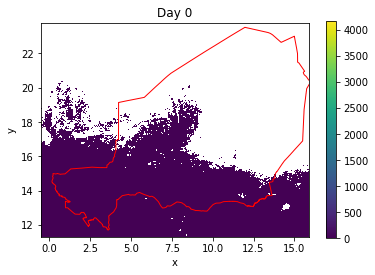

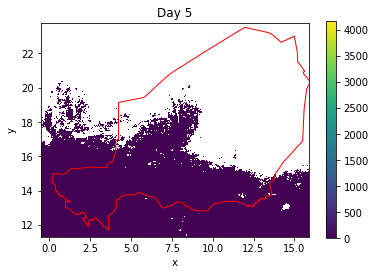

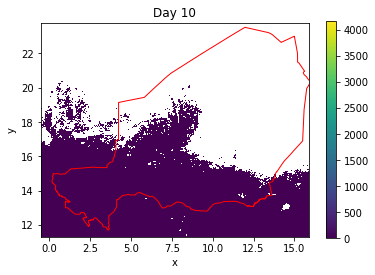

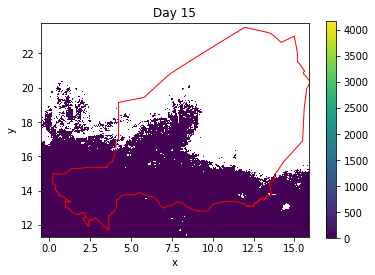

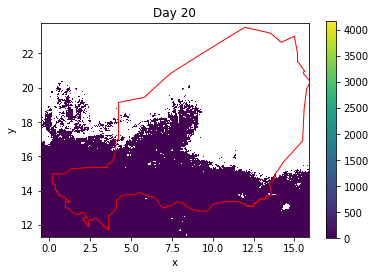

...

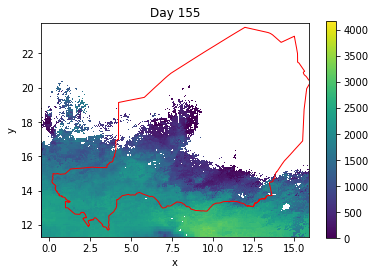

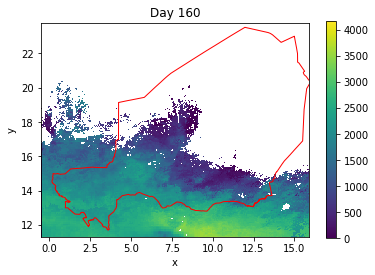

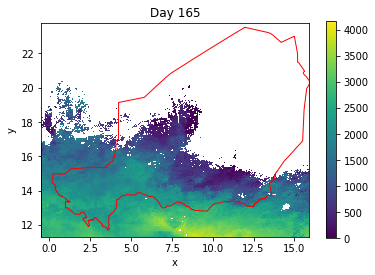

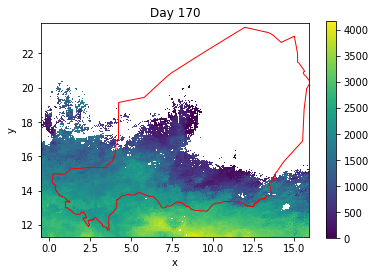

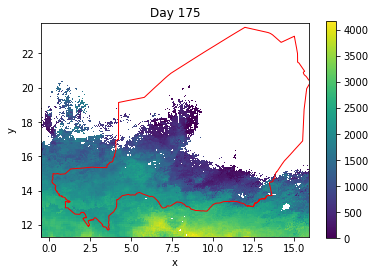

In [14]:
variable = "rdt"
time_resolution = 5
vmax = data[variable].max().values
gdf = gpd.read_file("https://biogeo.ucdavis.edu/data/gadm3.6/shp/gadm36_NER_shp.zip")
for i in range(int(round(duration/time_resolution,0))):
    # data[variable][time_resolution*i,:,:].plot(vmin=0, vmax=vmax)
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][time_resolution*i,:,:]).plot(vmin=0, vmax=vmax)
    gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='red', linewidth=1.0)
    plt.title("Day %s" % (i*time_resolution))
    plt.show()

In [75]:
#calcul du nombre de jours consécutifs où cstr est en dessous d'un seuil donné ; si cstr est au dessus du seuil, le compteur est remis à 0
cstr_thr = 0.5
day_thr=10

data["day_under_cstr_thres"] = xr.where(data["cstr"]<cstr_thr, 1, 0)

# copy as zeros
data["count_of_days_under_cstr_thres"] = xr.zeros_like(data["day_under_cstr_thres"])

for j in tqdm(range(duration)):
    data["count_of_days_under_cstr_thres"][j:,:,:] = xr.where(
        data["day_under_cstr_thres"][j,:,:]==1,
        data["count_of_days_under_cstr_thres"][j,:,:]+1,
        0,
    )
 
data["days_under_cstr_thres_above_day_thr"] = xr.zeros_like(data["day_under_cstr_thres"])
data["days_under_cstr_thres_above_day_thr"] = xr.where(
    data["count_of_days_under_cstr_thres"]>day_thr,
    1,
    0,
)

data["impact_at_critical_phase"] = xr.zeros_like(data["days_under_cstr_thres_above_day_thr"])
data["impact_at_critical_phase"] = xr.where(
    (data["days_under_cstr_thres_above_day_thr"]==1) & ((data["numPhase"]==4)|(data["numPhase"]==5)),
    1,
    0,
)

100%|██████████| 180/180 [00:01<00:00, 113.32it/s]


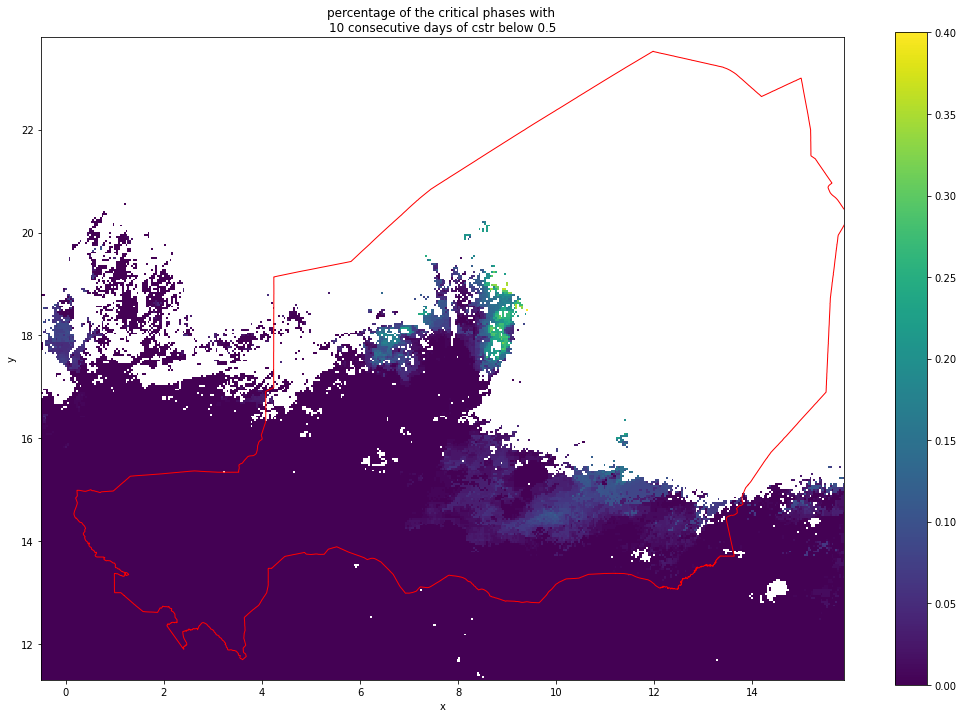

In [81]:

xr.where(np.isnan(data["ru"]),np.nan,data[variable].mean(dim="time")).plot()
# download and add ADM0 boundaries for Niger
gdf = gpd.read_file("https://biogeo.ucdavis.edu/data/gadm3.6/shp/gadm36_NER_shp.zip")
gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='red', linewidth=1.0)
plt.title("percentage of the critical phases with \n%s consecutive days of cstr below %s" % (day_thr, cstr_thr))
# make figure bigger
plt.gcf().set_size_inches(18, 12)
plt.show()

In [ ]:
variable = "days_under_cstr_thres_above_day_thr"
time_resolution = 5
vmax = data[variable].max().values
for i in range(int(round(duration/time_resolution,0))):
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][time_resolution*i,:,:]).plot(vmin=0, vmax=vmax)
    plt.title("Day %s" % (i*time_resolution))
    plt.show()

In [ ]:
variable = "impact_at_critical_phase"
time_resolution = 5
vmax = data[variable].max().values
for i in range(int(round(duration/time_resolution,0))):
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][time_resolution*i,:,:]).plot(vmin=0, vmax=vmax)
    plt.title("Day %s" % (i*time_resolution))
    plt.show()

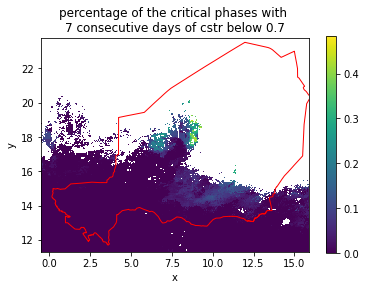

In [65]:
data["mapspam"]=mapspam_data

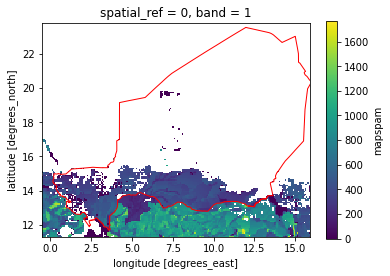

In [66]:

data["mapspam"].plot()
# download and add ADM0 boundaries for Niger
gdf = gpd.read_file("https://biogeo.ucdavis.edu/data/gadm3.6/shp/gadm36_NER_shp.zip")
gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='red', linewidth=1.0)

plt.show()

In [ ]:
# mean on a sliding window
variable = "impact_at_critical_phase"
window_width = 10
vmax = data[variable].max().values
for i in range(duration-window_width):
    xr.where(np.isnan(data["ru"]),np.nan,data[variable][i:i+window_width,:,:].mean(dim="time")).plot(vmin=0, vmax=vmax)
    # plt.title("Day %s" % (i*time_resolution))
    plt.show()

## Loading MAPSPAM 2017 data

In [15]:
# file was gathered from https://dataverse.harvard.edu/file.xhtml?fileId=4271678&version=3.0
# rainfed high inputs production (H)
# load image into a xarray dataarray
mapspam_data = xr.open_dataarray("../data/exemple_data/MapSPAM/spam2017V2r1_SSA_Y_PMIL_S.tif")

In [16]:
# reproject the dataarray to the same projection and resolution as the simulation
mapspam_data = mapspam_data.rio.reproject_match(data["rdt"])

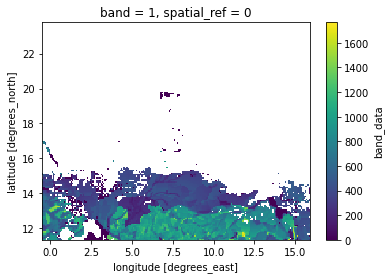

In [17]:
mapspam_data.plot()

In [18]:
# do a scatterplot of the values of the data["rdt"] against mapspam_data using plotly express
# remove the null values from the two datasets
# add a trendline to the scatterplot
import plotly.express as px
df = pd.DataFrame({"rdt":data["rdt"][-1,:,:].values.flatten(), "mapspam":mapspam_data.values.flatten()})
df = df[df["rdt"]>0]
df = df[df["mapspam"]>0]
fig = px.scatter(df, x="rdt", y="mapspam", trendline="ols")
fig.show()



In [19]:
corr = df[['rdt', 'mapspam']].corr()
corr.iloc[0,1]

0.5958013935050981

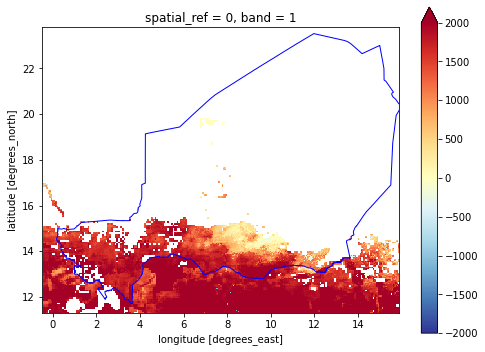

In [23]:
# compute the difference between the two datasets and plot the map
diff = data["rdt"][-1,:,:] - mapspam_data
diff.plot(cmap="RdYlBu_r", vmin=-2000, vmax=2000)
plt.rcParams['figure.figsize'] = [8,6]
gdf.plot(ax=plt.gca(), facecolor='none', edgecolor='blue', linewidth=1.0)
plt.show()


# calibration through optimization

In [7]:
mapspam_data = xr.open_dataarray("../data/exemple_data/MapSPAM/spam2017V2r1_SSA_Y_PMIL_S.tif")

In [8]:
def optimize(variableValue, data=data, mapspam_data=mapspam_data) :

    

    data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)

    paramVariete["KRdtPotA"] = variableValue

    start_time = time.time()
    data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)
    print("--- %s seconds, %s second per iter ---" % ((time.time() - start_time), (time.time() - start_time)/duration))
    
    mapspam_data = mapspam_data.rio.reproject_match(data["rdt"])

    df = pd.DataFrame({"rdt":data["rdt"][-1,:,:].values.flatten(), "mapspam":mapspam_data.values.flatten()})
    df = df[df["rdt"]>0]
    df = df[df["mapspam"]>0]
    corr = df[['rdt', 'mapspam']].corr().iloc[0,1]
    return corr

In [9]:
from bayes_opt import BayesianOptimization

# Bounded region of parameter space
pbounds = {'variableValue': (0.4, 1.1)}

optimizer = BayesianOptimization(
    f=optimize,
    pbounds=pbounds,
    random_state=1,
)

In [10]:
optimizer.maximize(
    init_points=2,
    n_iter=3,
)

|   iter    |  target   | variab... |
-------------------------------------


100%|██████████| 180/180 [06:02<00:00,  2.02s/it]


--- 362.7798681259155 seconds, 2.015443726380666 second per iter ---
| 1         | 0.3732    | 0.6919    |


: 

: 